# Food Dataset Analysis (EDA)

### Suggestions / Things to Explore in EDA (both datasets):

Note: for each insight found about the dataset, it is recommended to explain what it tells us about the dataset, why it's significant, 

- [ ] **Dataset directory and split integrity:** verify the expected Food-101 structure and examine the `/root/.cache/kagglehub/datasets/rkuo2000/uecfood256/versions/1/UECFOOD256` directory and contents. Confirm class counts match expectations (1,000 images per class)
- [ ] **Image resolutions and aspect ratios:** plot width / height histograms, aspect ratios, resolution scatter, and detect outliers
- [ ] **Brightness / contrast and dynamic range:** inspect pixel intensity histograms and per-image mean/std. Find and keep note of any overly dark, blown-out, or low-contrast classes (for normalization)
- [ ] **Sharpness / blur and quality issues:** use Laplacian variance for blur scores to identify classes with many blurry images


### UEC-Food256 Dataset
Things to consider while looking / exploring dataset

- [ ] **Dataset directory names:** as you can see when you first download the dataset, the folders are named as numbers (1-256). It would be a good idea to rename each folder based on the `category.txt` file which stores the name and id
  - After renaming, check to see if there are any folders of the same name. If there are, decide to merge or keep separate with reasoning.
- [ ]

### Resources:
(may be helpful)
*   https://neptune.ai/blog/data-exploration-for-image-segmentation-and-object-detection
*   https://medium.com/@juanabascal78/exploratory-image-analysis-part-1-advanced-density-plots-19b255075dbd
*   https://www.datacamp.com/tutorial/seeing-like-a-machine-a-beginners-guide-to-image-analysis-in-machine-learning

## Import + Download Dataset

In [1]:
%pip install python-dotenv
%pip install roboflow


   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 91.7/91.7 kB 6.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 66.8/66.8 kB 7.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 49.9/49.9 MB 20.6 MB/s eta 0:00:00:00:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.4/1.4 MB 89.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 5.5/5.5 MB 132.7 MB/s eta 0:00:0000:01
  Attempting uninstall: opencv-python-headless
    Found existing installation: opencv-python-headless 4.12.0.88
    Uninstalling opencv-python-headless-4.12.0.88:
      Successfully uninstalled opencv-python-headless-4.12.0.88
  Attempting uninstall: idna
    Found existing installation: idna 3.11
    Uninstalling idna-3.11:
      Successfully uninstalled idna-3.11


In [2]:
%pip install kagglehub

In [3]:
# RUN FOR UEC-FOOD256 DATASET

import kagglehub 
# Download latest version 
path = kagglehub.dataset_download("rkuo2000/uecfood256")
print("Path to dataset files:", path)

100%|██████████| 3.94G/3.94G [00:39<00:00, 108MB/s] 

Extracting files...


Path to dataset files: /root/.cache/kagglehub/datasets/rkuo2000/uecfood256/versions/1


In [4]:
# # RUN FOR YUSUF FOOD DATASET

# from roboflow import Roboflow
# from dotenv import load_dotenv
# import os

# load_dotenv()  # loads variables from .env into the environment

# api_key = os.getenv("YF_API_KEY")

# rf = Roboflow(api_key=api_key) 
# project = rf.workspace("caretech").project("food-dataset-uj20h-w2s4m")
# version = project.version(1)
# dataset = version.download("yolov8")


In [5]:
import os

for subdir, dirs, files in os.walk(path):
    print(f"{subdir} → {len(files)} files")

/root/.cache/kagglehub/datasets/rkuo2000/uecfood256/versions/1 → 0 files
/root/.cache/kagglehub/datasets/rkuo2000/uecfood256/versions/1/UECFOOD256 → 2 files
/root/.cache/kagglehub/datasets/rkuo2000/uecfood256/versions/1/UECFOOD256/9 → 170 files
/root/.cache/kagglehub/datasets/rkuo2000/uecfood256/versions/1/UECFOOD256/175 → 112 files
/root/.cache/kagglehub/datasets/rkuo2000/uecfood256/versions/1/UECFOOD256/204 → 111 files
/root/.cache/kagglehub/datasets/rkuo2000/uecfood256/versions/1/UECFOOD256/26 → 132 files
/root/.cache/kagglehub/datasets/rkuo2000/uecfood256/versions/1/UECFOOD256/242 → 117 files
/root/.cache/kagglehub/datasets/rkuo2000/uecfood256/versions/1/UECFOOD256/62 → 111 files
/root/.cache/kagglehub/datasets/rkuo2000/uecfood256/versions/1/UECFOOD256/66 → 108 files
/root/.cache/kagglehub/datasets/rkuo2000/uecfood256/versions/1/UECFOOD256/151 → 102 files
/root/.cache/kagglehub/datasets/rkuo2000/uecfood256/versions/1/UECFOOD256/205 → 112 files
/root/.cache/kagglehub/datasets/rkuo20

In [6]:
# rename uec food 256 directories

import os
import re
import shutil

DATA_ROOT = os.path.join(path, "UECFOOD256")
CATEGORY_TXT_PATH = os.path.join(path, "UECFOOD256","category.txt")
    
def sanitize_name(name: str) -> str:
  """
  make a filesystem-safe folder name
  - lowercase
  - trim
  - replace spaces with underscores
  - remove non-alphanumeric characters
  """
  s = name.strip().lower()
  s = s.replace("’", "'")  # normalize curly apostrophes
  s = s.replace('"', '')
  s = s.replace("/", " ")  # avoid path separators
  s = s.replace("\\", " ")
  s = s.replace("&", " and ")
  s = s.replace("+", " plus ")
  s = s.replace("–", "-").replace("—", "-")  # dashes
  s = s.replace("’", "'")
  s = s.replace("’", "'")
  # replace whitespace with underscores
  s = re.sub(r"\s+", "_", s)
  # remove invalid chars (keep a-z0-9 _ - . ')
  s = re.sub(r"[^a-z0-9_\-\.']", "", s)
  # collapse underscores
  s = re.sub(r"_+", "_", s)
  # strip leading/trailing underscores or dots
  s = s.strip("._")
  # fall back if empty
  if not s:
    s = "unnamed"
  return s


def parse_category_txt(path: str) -> dict:
  """
  parse category.txt file
  @return dict mapping numeric id (str) -> sanitized_name
  """
  id_to_name = {}
  if not os.path.isfile(path):
    raise FileNotFoundError(f"category.txt not found at {path}")
  with open(path, "r", encoding="utf-8") as f:
    for line in f:
      line = line.strip()
      if not line or line.startswith("#"):
        continue
      # Lines may be "id  name" with multiple spaces; first token is id, rest is name
      parts = re.split(r"\s+", line, maxsplit=1)
      if len(parts) != 2:
        # skip headers like "id  name"
        continue
      id_str, raw_name = parts
      if not id_str.isdigit():
        continue
      safe = sanitize_name(raw_name)
      id_to_name[id_str] = safe
  return id_to_name


def rename_dirs(root: str, id_to_name: dict, dry_run: bool = False) -> list:
  """
  Rename directories in root from numeric id to category name
  @return list of (old_path, new_path)
  """
  changes = []
  if not os.path.isdir(root):
    raise NotADirectoryError(f"Root path not found: {root}")

  # list only top-level directories
  for entry in os.listdir(root):
    old_path = os.path.join(root, entry)
    if not os.path.isdir(old_path):
      continue
    if not entry.isdigit():
      # Already renamed or a non-id dir like 'UECFOOD256' or 'category.txt' parent; skip
      continue
    id_str = entry
    if id_str not in id_to_name:
      print(f"Warning: id {id_str} not found in category.txt. Skipping.")
      continue
    base_name = id_to_name[id_str]
    new_name = base_name
    new_path = os.path.join(root, new_name)

    # resolve collisions
    if os.path.exists(new_path):
      # If target already exists and is the same folder (unlikely), skip
      # Else append id to make it unique
      alt_name = f"{base_name}_{id_str}"
      alt_path = os.path.join(root, alt_name)
      if os.path.exists(alt_path):
        # As a last resort append a numeric suffix
        suffix = 2
        while True:
          candidate = f"{base_name}_{id_str}_{suffix}"
          candidate_path = os.path.join(root, candidate)
          if not os.path.exists(candidate_path):
            new_name = candidate
            new_path = candidate_path
            break
          suffix += 1
      else:
          new_name = alt_name
          new_path = alt_path

    if dry_run:
      print(f"[DRY RUN] Would rename: {old_path} -> {new_path}")
    else:
      os.rename(old_path, new_path)
      changes.append((old_path, new_path))
      print(f"Renamed: {old_path} -> {new_path}")
  print("changes: ", changes)
  return changes



print(f"Reading categories from: {CATEGORY_TXT_PATH}")
id_to_name = parse_category_txt(CATEGORY_TXT_PATH)
print(f"Parsed {len(id_to_name)} categories.")

# preview changes first
print("\nPreview (dry run):")
rename_dirs(DATA_ROOT, id_to_name, dry_run=True)

# if preview looks good, do actual rename
proceed = True
if proceed:
    print("\nApplying renames:")
    changes = rename_dirs(DATA_ROOT, id_to_name, dry_run=False)
    print(f"\nDone. Renamed {len(changes)} folders.")
else:
    print("\nNo changes applied.")

Reading categories from: /root/.cache/kagglehub/datasets/rkuo2000/uecfood256/versions/1/UECFOOD256/category.txt
Parsed 256 categories.

Preview (dry run):
[DRY RUN] Would rename: /root/.cache/kagglehub/datasets/rkuo2000/uecfood256/versions/1/UECFOOD256/9 -> /root/.cache/kagglehub/datasets/rkuo2000/uecfood256/versions/1/UECFOOD256/fried_rice
[DRY RUN] Would rename: /root/.cache/kagglehub/datasets/rkuo2000/uecfood256/versions/1/UECFOOD256/175 -> /root/.cache/kagglehub/datasets/rkuo2000/uecfood256/versions/1/UECFOOD256/minced_pork_rice
[DRY RUN] Would rename: /root/.cache/kagglehub/datasets/rkuo2000/uecfood256/versions/1/UECFOOD256/204 -> /root/.cache/kagglehub/datasets/rkuo2000/uecfood256/versions/1/UECFOOD256/egg_noodle_in_chicken_yellow_curry
[DRY RUN] Would rename: /root/.cache/kagglehub/datasets/rkuo2000/uecfood256/versions/1/UECFOOD256/26 -> /root/.cache/kagglehub/datasets/rkuo2000/uecfood256/versions/1/UECFOOD256/fried_noodle
[DRY RUN] Would rename: /root/.cache/kagglehub/datasets/

In [7]:
%pip install imagehash pillow tqdm
import matplotlib.pyplot as plt
from PIL import Image
import imagehash
import os
from collections import defaultdict
from tqdm import tqdm

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 296.7/296.7 kB 9.9 MB/s eta 0:00:00


In [8]:
folders = sorted([f for f in os.listdir(DATA_ROOT) if os.path.isdir(os.path.join(DATA_ROOT, f))])
print(len(folders))
total = 0
for i, folder in enumerate(folders):
    folder_path = os.path.join(DATA_ROOT, folder)
    images = [f for f in os.listdir(folder_path) if f.lower().endswith(('.jpg', '.png', '.jpeg'))]
    print(f"{folder}: {len(images)}")
    total += len(images)

print(f"{total} images")


256
adobo: 114
almond_jelly: 104
apple_pie: 101
ayam_bakar: 114
ayam_goreng: 103
babi_guling: 108
bagel: 105
bak_kut_teh: 107
baked_salmon: 109
ball_shaped_bun_with_pork: 114
barbecued_red_pork_in_sauce_with_rice: 112
bean_curd_family_style: 105
beef_bowl: 167
beef_curry: 246
beef_in_oyster_sauce: 107
beef_noodle: 139
beef_noodle_soup: 118
bibimbap: 112
boiled_chicken_and_vegetables: 105
boiled_fish: 109
boned_sliced_hainan-style_chicken_with_marinated_rice: 112
braised_pork_meat_ball_with_napa_cabbage: 118
broiled_eel_bowl: 115
brownie: 108
bubur_ayam: 108
cabbage_roll: 107
caesar_salad: 104
champon: 106
charcoal-boiled_pork_neck: 115
chicken-'n'-egg_on_rice: 121
chicken_cutlet: 113
chicken_nugget: 103
chicken_rice: 100
chicken_rice_curry_with_coconut: 104
chilled_noodle: 117
chinese_pumpkin_pie: 102
chinese_soup: 165
chip_butty: 148
chop_suey: 100
chow_mein: 116
churro: 115
clear_soup: 115
coconut_milk-flavored_crepes_with_shrimp_and_beef: 111
coconut_milk_soup: 111
cold_tofu: 158
cr

In [9]:
def display_images():
    # 1 image from each "group"
    folders = sorted([f for f in os.listdir(DATA_ROOT) if os.path.isdir(os.path.join(DATA_ROOT, f))])
    num_cols = 5
    num_rows = (len(folders) + num_cols - 1) // num_cols

    fig, axes = plt.subplots(num_rows, num_cols, figsize=(20, 4*num_rows))
    axes = axes.ravel()

    for i, folder in enumerate(folders):
        folder_path = os.path.join(DATA_ROOT, folder)
        images = [f for f in os.listdir(folder_path) if f.lower().endswith(('.jpg', '.png', '.jpeg'))]
        
        if images and i < len(axes):
            img_path = os.path.join(folder_path, images[0])
            img = Image.open(img_path)
            axes[i].imshow(img)
            axes[i].set_title(folder, fontsize=8)
            axes[i].axis('off')


    plt.tight_layout()
    plt.show()

# display_images()

Checking categories for duplicates: 100%|██████████| 256/256 [01:56<00:00,  2.19it/s]


Total: Found 684 duplicate groups
2 duplicates:
  - /root/.cache/kagglehub/datasets/rkuo2000/uecfood256/versions/1/UECFOOD256/beef_noodle_soup/171407.jpg
  - /root/.cache/kagglehub/datasets/rkuo2000/uecfood256/versions/1/UECFOOD256/beef_noodle_soup/305984.jpg
2 duplicates:
  - /root/.cache/kagglehub/datasets/rkuo2000/uecfood256/versions/1/UECFOOD256/fried_rice/10821.jpg
  - /root/.cache/kagglehub/datasets/rkuo2000/uecfood256/versions/1/UECFOOD256/fried_rice/9269.jpg
2 duplicates:
  - /root/.cache/kagglehub/datasets/rkuo2000/uecfood256/versions/1/UECFOOD256/fried_rice/10710.jpg
  - /root/.cache/kagglehub/datasets/rkuo2000/uecfood256/versions/1/UECFOOD256/fried_rice/9179.jpg
2 duplicates:
  - /root/.cache/kagglehub/datasets/rkuo2000/uecfood256/versions/1/UECFOOD256/fried_rice/9278.jpg
  - /root/.cache/kagglehub/datasets/rkuo2000/uecfood256/versions/1/UECFOOD256/fried_rice/10784.jpg
2 duplicates:
  - /root/.cache/kagglehub/datasets/rkuo2000/uecfood256/versions/1/UECFOOD256/fried_rice/1078

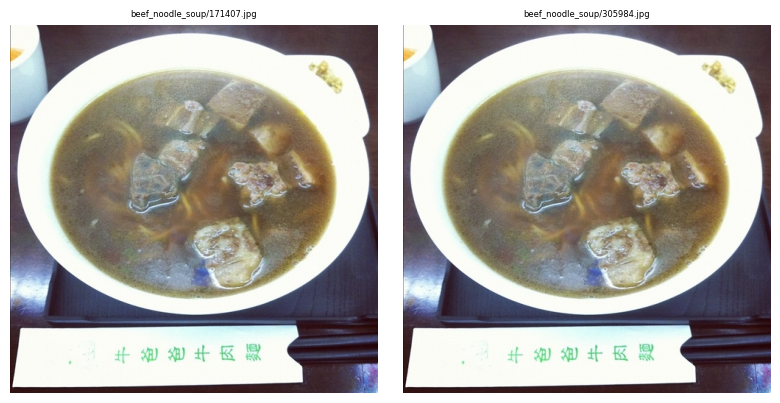


Group 2/636: 2 identical images
  - /root/.cache/kagglehub/datasets/rkuo2000/uecfood256/versions/1/UECFOOD256/fried_rice/9269.jpg


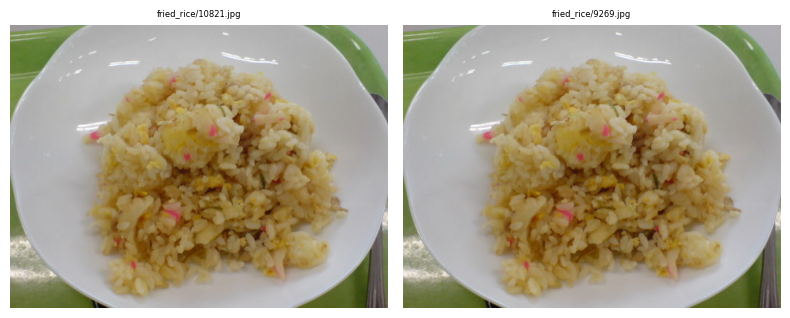


Group 3/636: 2 identical images
  - /root/.cache/kagglehub/datasets/rkuo2000/uecfood256/versions/1/UECFOOD256/fried_rice/9179.jpg


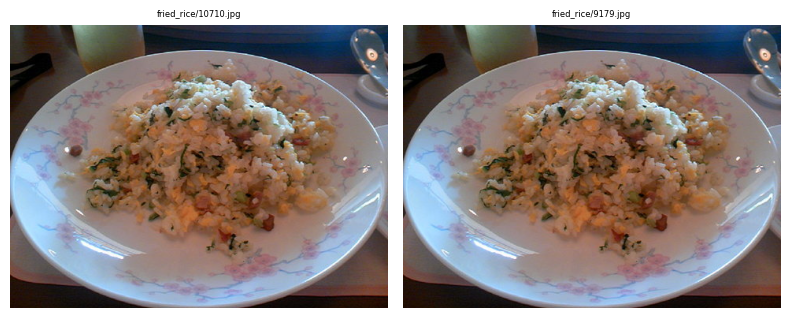


Group 4/636: 2 identical images
  - /root/.cache/kagglehub/datasets/rkuo2000/uecfood256/versions/1/UECFOOD256/fried_rice/10784.jpg


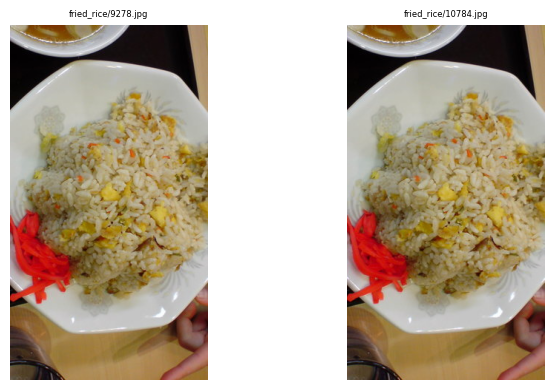


Group 5/636: 2 identical images
  - /root/.cache/kagglehub/datasets/rkuo2000/uecfood256/versions/1/UECFOOD256/fried_rice/9280.jpg


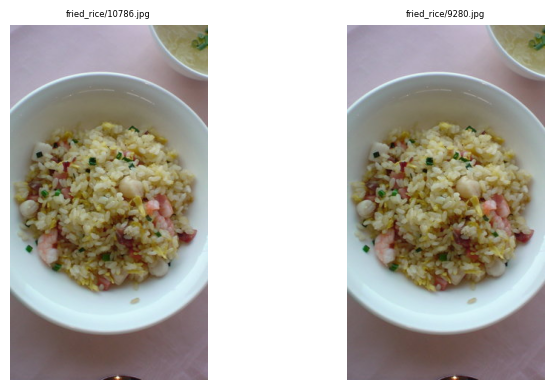


Group 6/636: 2 identical images
  - /root/.cache/kagglehub/datasets/rkuo2000/uecfood256/versions/1/UECFOOD256/fried_rice/15847.jpg


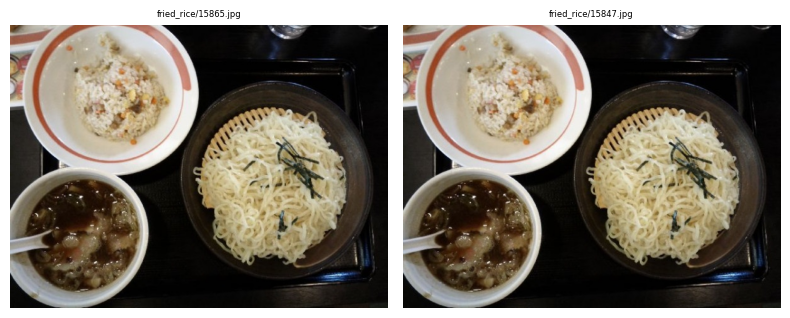


Group 7/636: 2 identical images
  - /root/.cache/kagglehub/datasets/rkuo2000/uecfood256/versions/1/UECFOOD256/fried_rice/10678.jpg


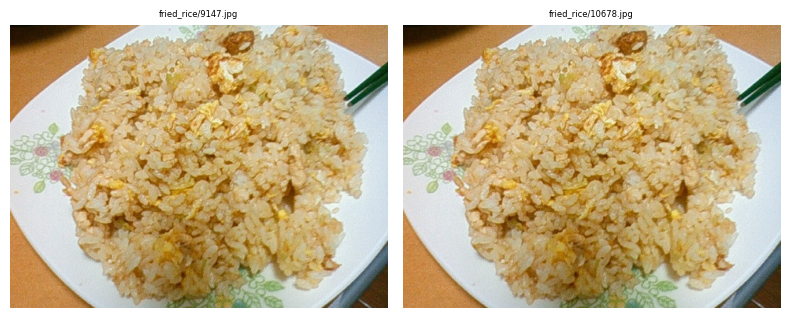


Group 8/636: 2 identical images
  - /root/.cache/kagglehub/datasets/rkuo2000/uecfood256/versions/1/UECFOOD256/fried_rice/11113.jpg


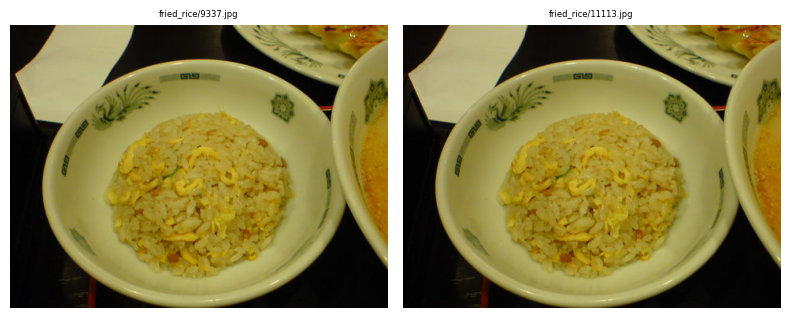


Group 9/636: 3 identical images
  - /root/.cache/kagglehub/datasets/rkuo2000/uecfood256/versions/1/UECFOOD256/fried_rice/11044.jpg
  - /root/.cache/kagglehub/datasets/rkuo2000/uecfood256/versions/1/UECFOOD256/fried_rice/11045.jpg


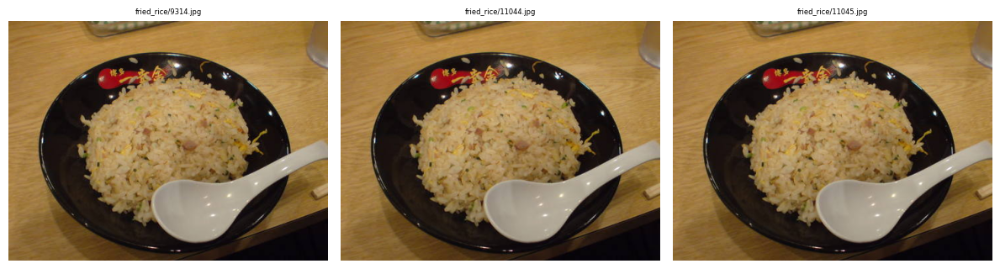


Group 10/636: 2 identical images
  - /root/.cache/kagglehub/datasets/rkuo2000/uecfood256/versions/1/UECFOOD256/fried_rice/11145.jpg


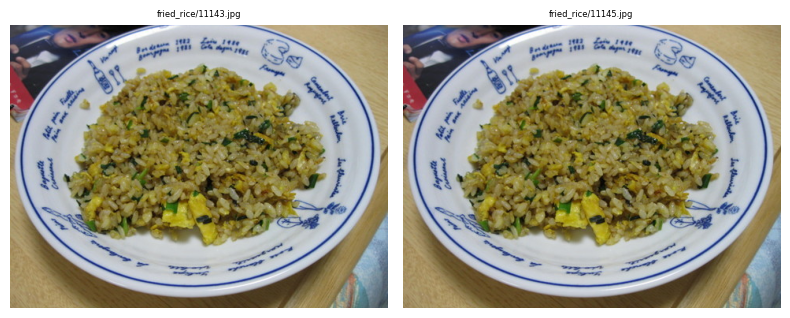

In [12]:
def find_duplicate_images(root_dir, hash_size=8):
    all_duplicates = {}
    total_dup_groups = 0
    
    folders = [f for f in os.listdir(root_dir) if os.path.isdir(os.path.join(root_dir, f))]
    
    for folder in tqdm(folders, desc="Checking categories for duplicates"):
        folder_path = os.path.join(root_dir, folder)
        hash_dict = defaultdict(list)
        
        # Hash all images
        for img_file in os.listdir(folder_path):
            if img_file.lower().endswith(('.jpg', '.jpeg', '.png')):
                img_path = os.path.join(folder_path, img_file)
                try:
                    img = Image.open(img_path)
                    # try imagehash.phash, imagehash.dhash, imagehash.whash
                    img_hash = imagehash.average_hash(img, hash_size=hash_size)
                    hash_dict[img_hash].append(img_path)
                except Exception as e:
                    print(f"Error processing {img_path}: {e}")
        
        category_duplicates = {h: paths for h, paths in hash_dict.items() if len(paths) > 1}
        
        if category_duplicates:
            all_duplicates.update(category_duplicates)
            total_dup_groups += len(category_duplicates)
    
    print(f"Total: Found {total_dup_groups} duplicate groups")
    
    return all_duplicates, []

exact_dups, near_dups = find_duplicate_images(DATA_ROOT, hash_size=8)

# Show results
for hash_val, paths in list(exact_dups.items())[:10]:
    print(f"{len(paths)} duplicates:")
    for p in paths:
        print(f"  - {p}")


def show_duplicate_group(image_paths):
    n = min(len(image_paths), 6)
    fig, axes = plt.subplots(1, n, figsize=(4*n, 4))
    if n == 1:
        axes = [axes]
    
    for ax, img_path in zip(axes, image_paths[:n]):
        img = Image.open(img_path)
        ax.imshow(img)
        ax.set_title(os.path.relpath(img_path, DATA_ROOT), fontsize=6, wrap=True)
        ax.axis('off')
    
    plt.tight_layout()
    plt.show()

print("\nDuplicate images")
for i, (hash_val, duplicate_paths) in enumerate(list(exact_dups.items())[:10], 1):
    print(f"\nGroup {i}/{len(exact_dups)}: {len(duplicate_paths)} identical images")
    for dup_path in duplicate_paths[1:]:
        print(f"  - {dup_path}")
    
    show_duplicate_group(duplicate_paths)

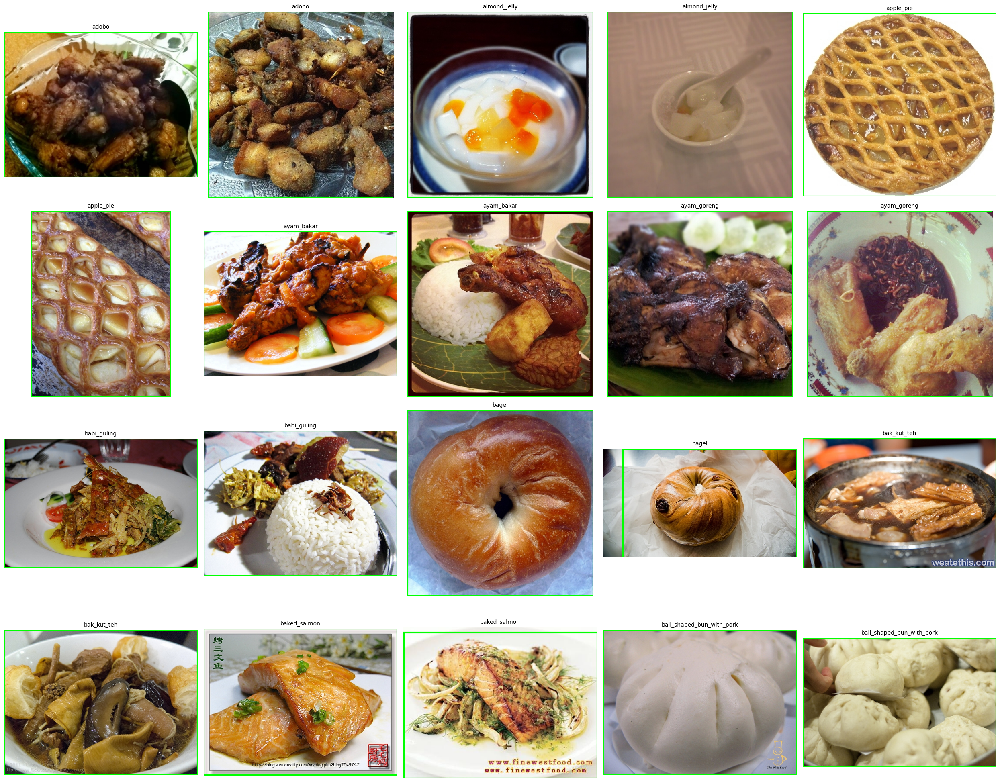

In [ ]:
import cv2
import numpy as np
from PIL import Image
import matplotlib.pyplot as plt
import matplotlib.patches as patches

def detect_food_bbox(image_path, padding_percent=0.05):

    img = cv2.imread(image_path)
    if img is None:
        return None
    
    img_h, img_w = img.shape[:2]
    
    mask = np.zeros(img.shape[:2], np.uint8)
    
    margin = 0.2
    rect = (int(img_w * margin), int(img_h * margin), 
            int(img_w * (1 - 2*margin)), int(img_h * (1 - 2*margin)))
    
    bgd_model = np.zeros((1, 65), np.float64)
    fgd_model = np.zeros((1, 65), np.float64)
    
    # grabcut algo (weird)
    try:
        cv2.grabCut(img, mask, rect, bgd_model, fgd_model, 5, cv2.GC_INIT_WITH_RECT)
        
        mask2 = np.where((mask == 2) | (mask == 0), 0, 1).astype('uint8')
        
        kernel = np.ones((5, 5), np.uint8)
        mask2 = cv2.morphologyEx(mask2, cv2.MORPH_CLOSE, kernel)
        mask2 = cv2.morphologyEx(mask2, cv2.MORPH_OPEN, kernel)
        
        contours, _ = cv2.findContours(mask2, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
        
        if not contours:
            x = int(img_w * 0.2)
            y = int(img_h * 0.2)
            w = int(img_w * 0.6)
            h = int(img_h * 0.6)
        else:
            largest_contour = max(contours, key=cv2.contourArea)
            x, y, w, h = cv2.boundingRect(largest_contour)
            
            pad_w = int(w * padding_percent)
            pad_h = int(h * padding_percent)
            
            x = max(0, x - pad_w)
            y = max(0, y - pad_h)
            w = min(img_w - x, w + 2*pad_w)
            h = min(img_h - y, h + 2*pad_h)
        
        x_center = (x + w/2) / img_w
        y_center = (y + h/2) / img_h
        width = w / img_w
        height = h / img_h
        
        return x_center, y_center, width, height
        
    except Exception as e:
        print(f"Error processing {image_path}")
        print(e)
        return None


def detect_food_simple(image_path, padding_percent=0.05):
    img = cv2.imread(image_path)
    if img is None:
        return None
    
    img_h, img_w = img.shape[:2]
    
    hsv = cv2.cvtColor(img, cv2.COLOR_BGR2HSV)
    
    lower_bright = np.array([0, 0, 180])
    upper_bright = np.array([180, 50, 255])
    
    mask_bright = cv2.inRange(hsv, lower_bright, upper_bright)
    
    mask_food = cv2.bitwise_not(mask_bright)
    lower_sat = np.array([0, 30, 30])
    upper_sat = np.array([180, 255, 255])
    mask_saturated = cv2.inRange(hsv, lower_sat, upper_sat)
    
    # masks
    mask = cv2.bitwise_or(mask_food, mask_saturated)
    kernel = np.ones((7, 7), np.uint8)
    mask = cv2.morphologyEx(mask, cv2.MORPH_CLOSE, kernel)
    mask = cv2.morphologyEx(mask, cv2.MORPH_OPEN, kernel)
    
    contours, _ = cv2.findContours(mask, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    
    if not contours:
        return 0.5, 0.5, 0.6, 0.6
    
    largest_contour = max(contours, key=cv2.contourArea)
    x, y, w, h = cv2.boundingRect(largest_contour)
    
    pad_w = int(w * padding_percent)
    pad_h = int(h * padding_percent)
    
    x = max(0, x - pad_w)
    y = max(0, y - pad_h)
    w = min(img_w - x, w + 2*pad_w)
    h = min(img_h - y, h + 2*pad_h)
    
    # Convert YOLO format
    x_center = (x + w/2) / img_w
    y_center = (y + h/2) / img_h
    width = w / img_w
    height = h / img_h
    
    return x_center, y_center, width, height


sample_count = 20
sample_images = []

folders = sorted([f for f in os.listdir(DATA_ROOT) if os.path.isdir(os.path.join(DATA_ROOT, f))])

for folder in folders:
    if len(sample_images) >= sample_count:
        break
    folder_path = os.path.join(DATA_ROOT, folder)
    images = [f for f in os.listdir(folder_path) if f.lower().endswith(('.jpg', '.png', '.jpeg'))]
    for img in images[:2]:
        if len(sample_images) >= sample_count:
            break
        sample_images.append((os.path.join(folder_path, img), folder))

# Should be dynamic based on sample_count?
num_cols = 5
num_rows = (len(sample_images) + num_cols - 1) // num_cols  

fig, axes = plt.subplots(num_rows, num_cols, figsize=(5*num_cols, 5*num_rows))
axes = axes.ravel()

for idx, (img_path, category) in enumerate(sample_images):
    bbox = detect_food_simple(img_path, padding_percent=0.05)
    
    if bbox:
        img = Image.open(img_path)
        img_w, img_h = img.size
        
        x_center, y_center, width, height = bbox
        x = (x_center - width/2) * img_w
        y = (y_center - height/2) * img_h
        w = width * img_w
        h = height * img_h
        
        axes[idx].imshow(img)
        
        # bounding box
        rect = patches.Rectangle((x, y), w, h, linewidth=3, edgecolor='lime', facecolor='none', label='Food BBox')
        axes[idx].add_patch(rect)
        
        axes[idx].set_title(f"{category}", fontsize=10)
        axes[idx].axis('off')


plt.tight_layout()
plt.show()
